# The Best Place to Have a Restaurant in Metro Manila.

Before we start, we need to have the necessary libraries imported.

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python-3.7-OpenCE

  added / updated specs:
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2021.5.30          |   py37h89c1867_0         141 KB  conda-forge
    geographiclib-1.52         |     pyhd8ed1ab_0          35 KB  conda-forge
    geopy-2.2.0                |     pyhd8ed1ab_0          67 KB  conda-forge
    openssl-1.1.1k             |       h7f98852_0         2.1 MB  conda-forge
    python_abi-3.7             |          2_cp37m           4 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.4 MB

The following NEW packages will be INSTALLED:

  geographiclib      conda-forge/noarch::geographiclib-1.52-pyhd8ed1ab_0
  geopy              conda-forge/noarch::geopy-2.2.0-pyhd8ed1ab_0
  py

## 1. Download and Explore Dataset

The datasets necessary are already downloaded in the Data Assets column of this project. This is done for easier import of the datasets in this project. 

In [2]:
import os, types
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.

if os.environ.get('RUNTIME_ENV_LOCATION_TYPE') == 'external':
    endpoint_ec2d60ba0656445ba4ab0c771aa5f2ad = 'https://s3.eu.cloud-object-storage.appdomain.cloud'
else:
    endpoint_ec2d60ba0656445ba4ab0c771aa5f2ad = 'https://s3.private.eu.cloud-object-storage.appdomain.cloud'

client_ec2d60ba0656445ba4ab0c771aa5f2ad = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='x4AARovC1gdLox5gGiqtW4ieao75T34Ev152rmSW1Iey',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url=endpoint_ec2d60ba0656445ba4ab0c771aa5f2ad)

body = client_ec2d60ba0656445ba4ab0c771aa5f2ad.get_object(Bucket='courseracapstone-donotdelete-pr-uvoy9dapbbn3go',Key='location.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_1 = pd.read_csv(body)
df_data_1.head()


,id,address,city,city_id,country_id,latitude,locality,locality_verbose,longitude,zipcode
0,6316125,"V. Corporate Center, Soliman Street, Salcedo V...",Makati City,63,162,14.560313,Salcedo Village,"Salcedo Village, Makati City",121.024638,NaN
1,18409457,"Level 3, Greenbelt 3, Ayala Center, Greenbelt,...",Makati City,63,162,14.552137,"Greenbelt 3, San Lorenzo, Makati City","Greenbelt 3, San Lorenzo, Makati City, Makati ...",121.021325,NaN
2,6307689,"5012 P. Burgos Street, Poblacion, Makati City ...",Makati City,63,162,14.563144,Poblacion,"Poblacion, Makati City",121.029800,1210.0
3,18581637,"CKB Centre, Tomas Morato Avenue Corner Scout R...",Quezon City,63,162,14.633713,Tomas Morato,"Tomas Morato, Quezon City",121.035026,NaN
4,6315438,"Sixth Floor, SM Aura Premier, C5 Road Corner 2...",Taguig City,63,162,14.546236,"SM Aura Premier, Bonifacio Global City, Taguig...","SM Aura Premier, Bonifacio Global City, Taguig...",121.054365,NaN


In [3]:

body = client_ec2d60ba0656445ba4ab0c771aa5f2ad.get_object(Bucket='courseracapstone-donotdelete-pr-uvoy9dapbbn3go',Key='ratings.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_2 = pd.read_csv(body)
df_data_2.head()


,id,aggregate_rating,rating_color,rating_text,votes
0,6316125,4.9,3F7E00,Excellent,1394
1,18409457,4.6,3F7E00,Excellent,602
2,6307689,4.0,5BA829,Very Good,563
3,18581637,4.0,5BA829,Very Good,413
4,6315438,4.6,3F7E00,Excellent,960


In [4]:

body = client_ec2d60ba0656445ba4ab0c771aa5f2ad.get_object(Bucket='courseracapstone-donotdelete-pr-uvoy9dapbbn3go',Key='zomato.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_3 = pd.read_csv(body)
df_data_3.head()


,id,average_cost_for_two,book_url,cuisines,currency,deeplink,events_url,featured_image,has_online_delivery,has_table_booking,include_bogo_offers,is_book_form_web_view,is_delivering_now,is_table_reservation_supported,is_zomato_book_res,menu_url,mezzo_provider,name,photos_url,price_range,thumb,url
0,6316125,1000,NaN,"Japanese, Ramen",P,zomato://restaurant/6316125,https://www.zomato.com/manila/mendokoro-ramenb...,https://b.zmtcdn.com/data/reviews_photos/971/2...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/mendokoro-ramenb...,OTHER,Mendokoro Ramenba,https://www.zomato.com/manila/mendokoro-ramenb...,3,https://b.zmtcdn.com/data/reviews_photos/971/2...,https://www.zomato.com/manila/mendokoro-ramenb...
1,18409457,1300,NaN,"Korean, Grill, Korean BBQ",P,zomato://restaurant/18409457,https://www.zomato.com/manila/soban-k-town-gri...,https://b.zmtcdn.com/data/res_imagery/18290970...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/soban-k-town-gri...,OTHER,Soban K-Town Grill,https://www.zomato.com/manila/soban-k-town-gri...,3,https://b.zmtcdn.com/data/res_imagery/18290970...,https://www.zomato.com/manila/soban-k-town-gri...
2,6307689,1600,NaN,"American, Filipino",P,zomato://restaurant/6307689,https://www.zomato.com/manila/filling-station-...,https://b.zmtcdn.com/data/pictures/9/6307689/b...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/filling-station-...,OTHER,Filling Station,https://www.zomato.com/manila/filling-station-...,4,https://b.zmtcdn.com/data/pictures/9/6307689/b...,https://www.zomato.com/manila/filling-station-...
3,18581637,1000,NaN,Korean,P,zomato://restaurant/18581637,https://www.zomato.com/manila/romantic-baboy-t...,https://b.zmtcdn.com/data/reviews_photos/cc1/a...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/romantic-baboy-t...,OTHER,Romantic Baboy,https://www.zomato.com/manila/romantic-baboy-t...,3,https://b.zmtcdn.com/data/reviews_photos/cc1/a...,https://www.zomato.com/manila/romantic-baboy-t...
4,6315438,3000,NaN,"Seafood, American, Mediterranean, Japanese",P,zomato://restaurant/6315438,https://www.zomato.com/manila/niu-by-vikings-b...,https://b.zmtcdn.com/data/pictures/chains/8/63...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/niu-by-vikings-b...,OTHER,NIU by Vikings,https://www.zomato.com/manila/niu-by-vikings-b...,4,https://b.zmtcdn.com/data/pictures/chains/8/63...,https://www.zomato.com/manila/niu-by-vikings-b...


### We want to combine all dataframes based on the same id.

In [5]:
df1 = pd.merge(df_data_1, df_data_2, on="id")
df1.head()

,id,address,city,city_id,country_id,latitude,locality,locality_verbose,longitude,zipcode,aggregate_rating,rating_color,rating_text,votes
0,6316125,"V. Corporate Center, Soliman Street, Salcedo V...",Makati City,63,162,14.560313,Salcedo Village,"Salcedo Village, Makati City",121.024638,NaN,4.9,3F7E00,Excellent,1394
1,18409457,"Level 3, Greenbelt 3, Ayala Center, Greenbelt,...",Makati City,63,162,14.552137,"Greenbelt 3, San Lorenzo, Makati City","Greenbelt 3, San Lorenzo, Makati City, Makati ...",121.021325,NaN,4.6,3F7E00,Excellent,602
2,6307689,"5012 P. Burgos Street, Poblacion, Makati City ...",Makati City,63,162,14.563144,Poblacion,"Poblacion, Makati City",121.029800,1210.0,4.0,5BA829,Very Good,563
3,18581637,"CKB Centre, Tomas Morato Avenue Corner Scout R...",Quezon City,63,162,14.633713,Tomas Morato,"Tomas Morato, Quezon City",121.035026,NaN,4.0,5BA829,Very Good,413
4,6315438,"Sixth Floor, SM Aura Premier, C5 Road Corner 2...",Taguig City,63,162,14.546236,"SM Aura Premier, Bonifacio Global City, Taguig...","SM Aura Premier, Bonifacio Global City, Taguig...",121.054365,NaN,4.6,3F7E00,Excellent,960


In [6]:
df = pd.merge(df1, df_data_3, on='id')
df.head()

,id,address,city,city_id,country_id,latitude,locality,locality_verbose,longitude,zipcode,aggregate_rating,rating_color,rating_text,votes,average_cost_for_two,book_url,cuisines,currency,deeplink,events_url,featured_image,has_online_delivery,has_table_booking,include_bogo_offers,is_book_form_web_view,is_delivering_now,is_table_reservation_supported,is_zomato_book_res,menu_url,mezzo_provider,name,photos_url,price_range,thumb,url
0,6316125,"V. Corporate Center, Soliman Street, Salcedo V...",Makati City,63,162,14.560313,Salcedo Village,"Salcedo Village, Makati City",121.024638,NaN,4.9,3F7E00,Excellent,1394,1000,NaN,"Japanese, Ramen",P,zomato://restaurant/6316125,https://www.zomato.com/manila/mendokoro-ramenb...,https://b.zmtcdn.com/data/reviews_photos/971/2...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/mendokoro-ramenb...,OTHER,Mendokoro Ramenba,https://www.zomato.com/manila/mendokoro-ramenb...,3,https://b.zmtcdn.com/data/reviews_photos/971/2...,https://www.zomato.com/manila/mendokoro-ramenb...
1,18409457,"Level 3, Greenbelt 3, Ayala Center, Greenbelt,...",Makati City,63,162,14.552137,"Greenbelt 3, San Lorenzo, Makati City","Greenbelt 3, San Lorenzo, Makati City, Makati ...",121.021325,NaN,4.6,3F7E00,Excellent,602,1300,NaN,"Korean, Grill, Korean BBQ",P,zomato://restaurant/18409457,https://www.zomato.com/manila/soban-k-town-gri...,https://b.zmtcdn.com/data/res_imagery/18290970...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/soban-k-town-gri...,OTHER,Soban K-Town Grill,https://www.zomato.com/manila/soban-k-town-gri...,3,https://b.zmtcdn.com/data/res_imagery/18290970...,https://www.zomato.com/manila/soban-k-town-gri...
2,6307689,"5012 P. Burgos Street, Poblacion, Makati City ...",Makati City,63,162,14.563144,Poblacion,"Poblacion, Makati City",121.029800,1210.0,4.0,5BA829,Very Good,563,1600,NaN,"American, Filipino",P,zomato://restaurant/6307689,https://www.zomato.com/manila/filling-station-...,https://b.zmtcdn.com/data/pictures/9/6307689/b...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/filling-station-...,OTHER,Filling Station,https://www.zomato.com/manila/filling-station-...,4,https://b.zmtcdn.com/data/pictures/9/6307689/b...,https://www.zomato.com/manila/filling-station-...
3,18581637,"CKB Centre, Tomas Morato Avenue Corner Scout R...",Quezon City,63,162,14.633713,Tomas Morato,"Tomas Morato, Quezon City",121.035026,NaN,4.0,5BA829,Very Good,413,1000,NaN,Korean,P,zomato://restaurant/18581637,https://www.zomato.com/manila/romantic-baboy-t...,https://b.zmtcdn.com/data/reviews_photos/cc1/a...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/romantic-baboy-t...,OTHER,Romantic Baboy,https://www.zomato.com/manila/romantic-baboy-t...,3,https://b.zmtcdn.com/data/reviews_photos/cc1/a...,https://www.zomato.com/manila/romantic-baboy-t...
4,6315438,"Sixth Floor, SM Aura Premier, C5 Road Corner 2...",Taguig City,63,162,14.546236,"SM Aura Premier, Bonifacio Global City, Taguig...","SM Aura Premier, Bonifacio Global City, Taguig...",121.054365,NaN,4.6,3F7E00,Excellent,960,3000,NaN,"Seafood, American, Mediterranean, Japanese",P,zomato://restaurant/6315438,https://www.zomato.com/manila/niu-by-vikings-b...,https://b.zmtcdn.com/data/pictures/chains/8/63...,0,0,True,0.0,0,0,0.0,https://www.zomato.com/manila/niu-by-vikings-b...,OTHER,NIU by Vikings,https://www.zomato.com/manila/niu-by-vikings-b...,4,https://b.zmtcdn.com/data/pictures/chains/8/63...,https://www.zomato.com/manila/niu-by-vikings-b...


In [7]:
df.shape

(6830, 35)

## Data Cleaning 

Remove the unwanted rows and columns from the dataset.

For my main data, I only want the *name of the restaurant, locality, latitude, longitude, the type of cuisine each restaurant serves, ratings (both number and text), and the vote.* 

Since the name of the restaurants are not available, I kept the id instead.

In [8]:
df2 = df[df.longitude !=0.000000][['id','locality','longitude','latitude','cuisines','aggregate_rating','rating_text','votes']]

In [9]:
df2.shape

(6830, 8)

In [10]:
df2 = df2[df2['aggregate_rating'] !=0.0]

In [11]:
df2.head()

,id,locality,longitude,latitude,cuisines,aggregate_rating,rating_text,votes
0,6316125,Salcedo Village,121.024638,14.560313,"Japanese, Ramen",4.9,Excellent,1394
1,18409457,"Greenbelt 3, San Lorenzo, Makati City",121.021325,14.552137,"Korean, Grill, Korean BBQ",4.6,Excellent,602
2,6307689,Poblacion,121.029800,14.563144,"American, Filipino",4.0,Very Good,563
3,18581637,Tomas Morato,121.035026,14.633713,Korean,4.0,Very Good,413
4,6315438,"SM Aura Premier, Bonifacio Global City, Taguig...",121.054365,14.546236,"Seafood, American, Mediterranean, Japanese",4.6,Excellent,960


In [12]:
df2.shape

(5962, 8)

Let's rename the column names.

Below is the main dataframe I will be using for this project.

In [13]:
df2.rename(columns={"id":"ID","locality":"Locality","longitude":"Longitude",
                    'latitude':'Latitude',"cuisines":"Cuisines",
                    "aggregate_rating":"Aggregate Rating",
                    'rating_text':"Rating Text","votes":"Votes"},inplace=True)

df2.head()

,ID,Locality,Longitude,Latitude,Cuisines,Aggregate Rating,Rating Text,Votes
0,6316125,Salcedo Village,121.024638,14.560313,"Japanese, Ramen",4.9,Excellent,1394
1,18409457,"Greenbelt 3, San Lorenzo, Makati City",121.021325,14.552137,"Korean, Grill, Korean BBQ",4.6,Excellent,602
2,6307689,Poblacion,121.029800,14.563144,"American, Filipino",4.0,Very Good,563
3,18581637,Tomas Morato,121.035026,14.633713,Korean,4.0,Very Good,413
4,6315438,"SM Aura Premier, Bonifacio Global City, Taguig...",121.054365,14.546236,"Seafood, American, Mediterranean, Japanese",4.6,Excellent,960


To make sure, check if each column has NaN values. If there are then take the entire row out.

In [14]:
df2.isnull().any()

ID                  False
Locality            False
Longitude           False
Latitude            False
Cuisines             True
Aggregate Rating    False
Rating Text         False
Votes               False
dtype: bool

Since the Cuisines column has a NaN value and we need only restaurants with a cuisine listed, erase the entire row that has the NaN value.

In [15]:
df.na = df2[df2.isnull().any(axis=1)]
print(df.na)

# taking the index for this restaurant, remove it from the dataframe
df2.drop(index = 621 , axis=0, inplace=True)

           ID                                           Locality   Longitude  \
621  18683703  Ayala Malls Marikina, Marikina Heights, Mariki...  121.115701   

      Latitude Cuisines  Aggregate Rating Rating Text  Votes  
621  14.648919      NaN               3.0     Average      4  


/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/ipykernel/__main__.py:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  if __name__ == '__main__':


Now check to see there are no NaN values.

In [16]:
df2.isnull().any()

ID                  False
Locality            False
Longitude           False
Latitude            False
Cuisines            False
Aggregate Rating    False
Rating Text         False
Votes               False
dtype: bool

We can also see that there is one less row from the 5962 that was originally.

In [17]:
df2.shape

(5961, 8)

We are now good to go!!

### Create map to show restaurants in Metro Manila 

I will use **folium** library to visualize the geographic details of Metro Manila and its locality. I used the latitude and longitude values to get the map generated. 

In [18]:
latitude = 14.6091
longitude = 121.0223

In [19]:
metro_manila_map = folium.Map(location=[latitude,longitude], zoom_start=12)


for latitude, longitude, Locality, in zip(df2['Latitude'], df2['Longitude'], df2['Locality']):
    label = folium.Popup(Locality, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(metro_manila_map)

metro_manila_map

If not seen, then look at README.md

## What places have the best restaurant in Metro Manila?

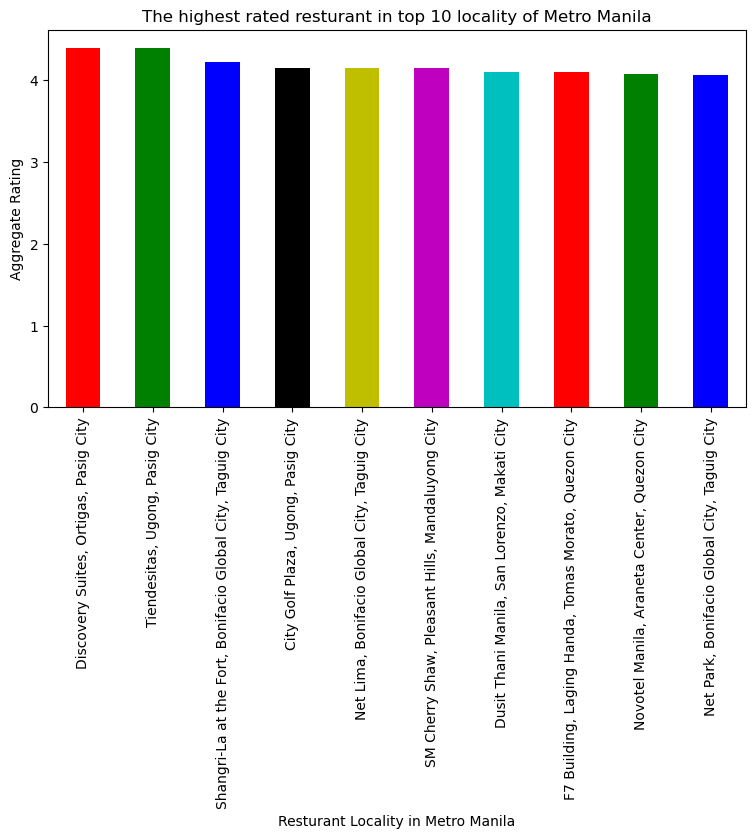

In [20]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The highest rated resturant in top 10 locality of Metro Manila')
#On x-axis

#giving a bar plot
df2.groupby('Locality')['Aggregate Rating'].mean().nlargest(10).plot(kind='bar', color=list('rgbkymc'))

plt.xlabel('Resturant Locality in Metro Manila')
#On y-axis
plt.ylabel('Aggregate Rating')
#displays the plot
plt.show()

We can see that the best rated restaurants are located in both **Discovery Suites in Ortigas** and in **Tiendesita in Ugong**. Both are located in **Pasig City**.

## What places have the worst rated restaurants in Metro Manila?

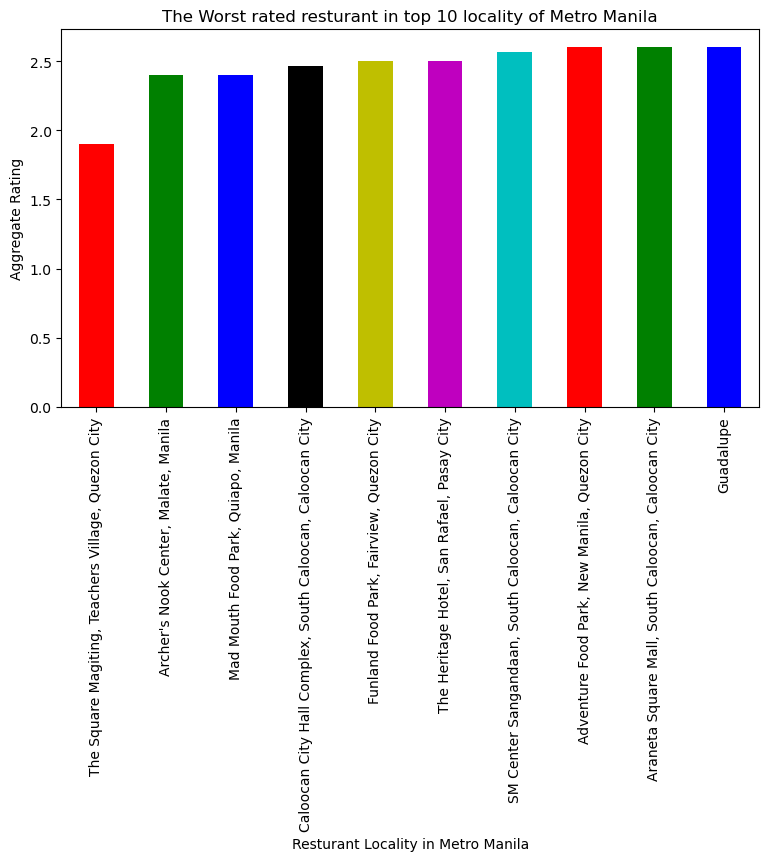

In [21]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The Worst rated resturant in top 10 locality of Metro Manila')
#On x-axis

#giving a bar plot

df2.groupby('Locality')['Aggregate Rating'].mean().nsmallest(10).plot(kind='bar', color = list('rgbkymc'))

plt.xlabel('Resturant Locality in Metro Manila')
#On y-axis
plt.ylabel('Aggregate Rating')

#displays the plot
plt.show()

The worst Restaurant is lcoated at **The Square Magiting, Teachers Village, Quezon City**. 

## Which locality has the most number of restaurants? Or which locality is suitable for person who wants a lot of options?

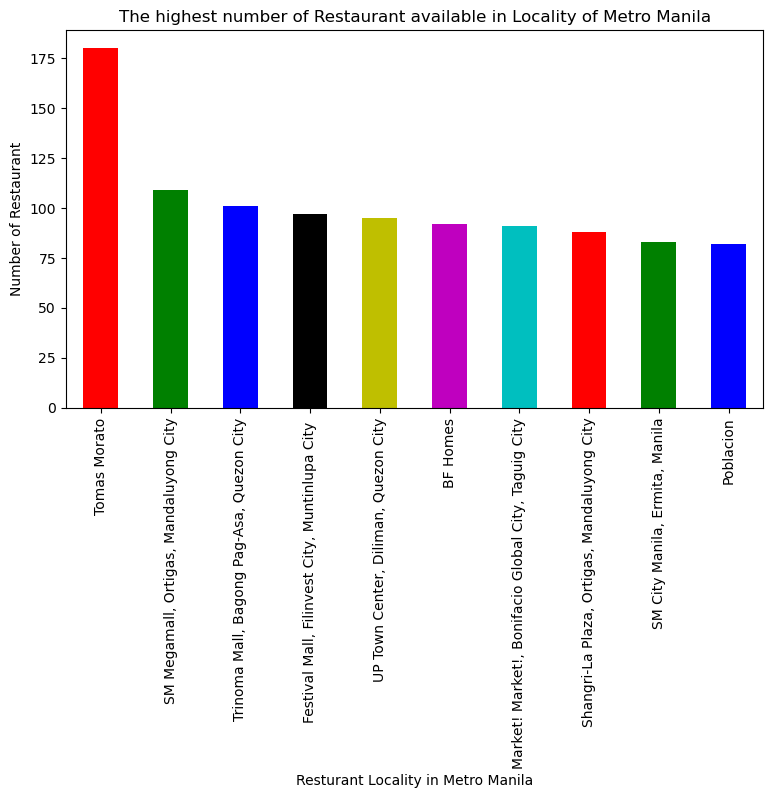

In [22]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The highest number of Restaurant available in Locality of Metro Manila')
#On x-axis

#giving a bar plot
df2.groupby('Locality')['ID'].count().nlargest(10).plot(kind='bar', color=list('rgbkymc'))

plt.xlabel('Resturant Locality in Metro Manila')
#On y-axis
plt.ylabel('Number of Restaurant')

#displays the plot
plt.show()

We can see that if someone wants a lot options to choose from, they would have to go to **Tomas Morato**.

## What place is not suitable for someone who wants a lot of options?

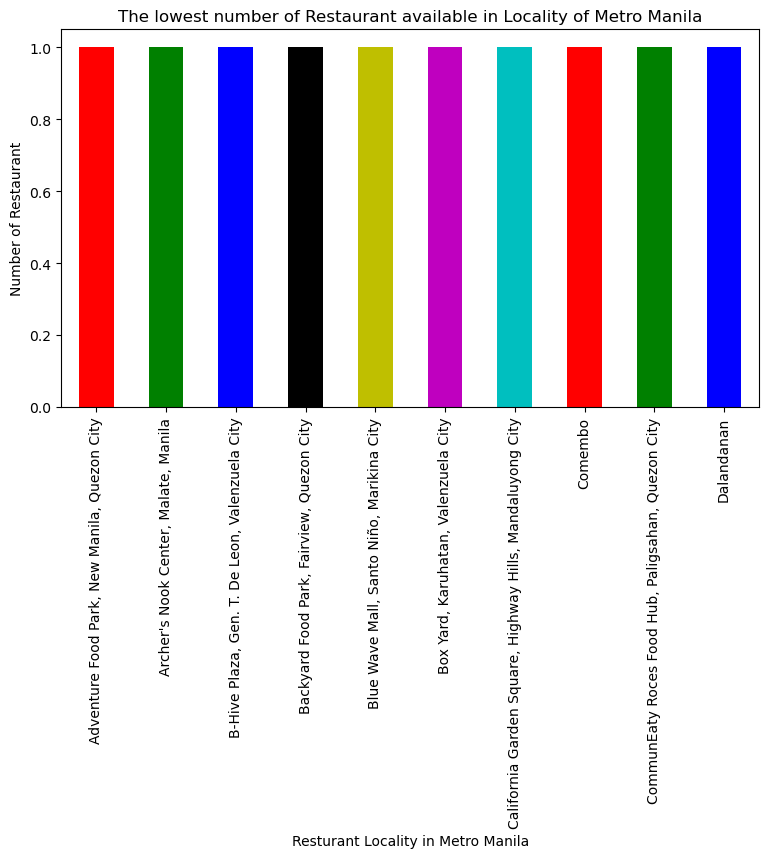

In [23]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The lowest number of Restaurant available in Locality of Metro Manila')
#On x-axis

#giving a bar plot
df2.groupby('Locality')['ID'].count().nsmallest(10).plot(kind='bar', color=list('rgbkymc'))

plt.xlabel('Resturant Locality in Metro Manila')
#On y-axis
plt.ylabel('Number of Restaurant')

#displays the plot
plt.show()

Since these localities each have only one restaurant, it is best to remember not stay anywhere these areas.

## What are the best places for a Korean restaurant in Metro Manila?

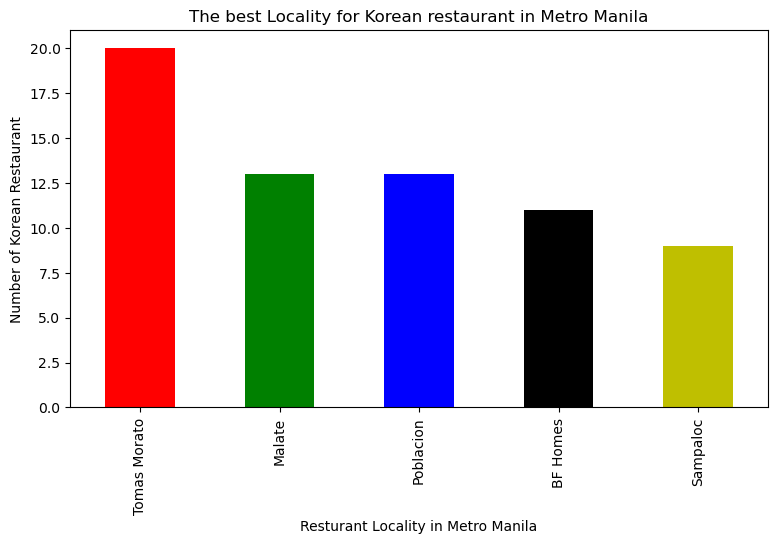

In [24]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The best Locality for Korean restaurant in Metro Manila')
#On x-axis

#giving a bar plot
df2[df2['Cuisines'].str.contains('Korean')].groupby('Locality')['ID'].count().nlargest(5).plot(kind='bar', color=list('rgbkymc'))

plt.xlabel('Resturant Locality in Metro Manila')
#On y-axis
plt.ylabel('Number of Korean Restaurant')

#displays the plot
plt.show()

From this, we can see that if a person wants to eat Korean food, then **Tomas Morato** is the best place to go despite any ratings.

## What is the best rated Korean restaurants?

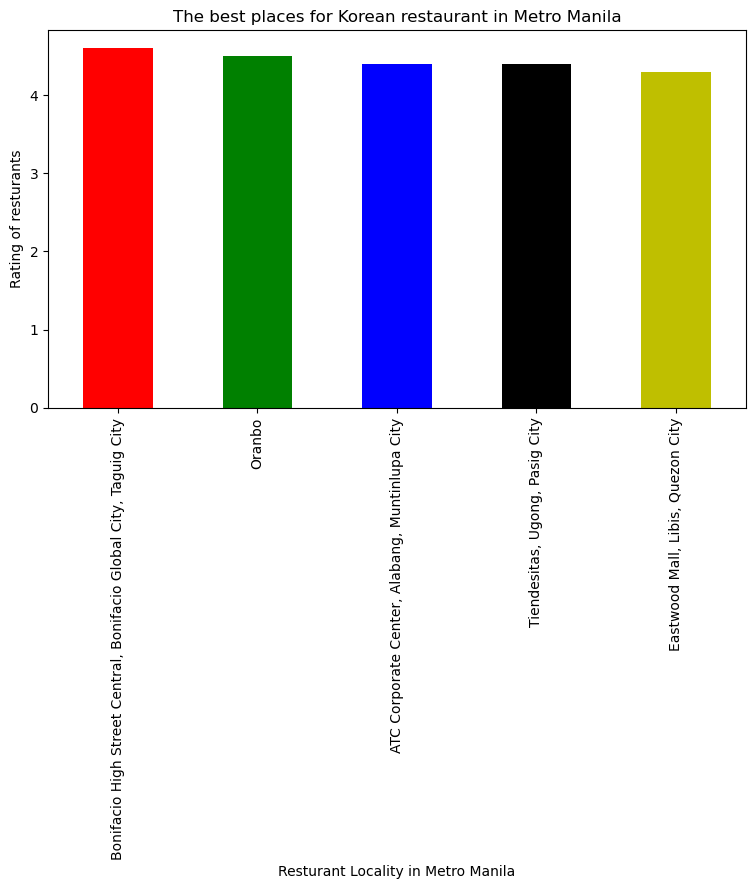

In [25]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The best places for Korean restaurant in Metro Manila')
#On x-axis

#giving a bar plot
df2[df2['Cuisines'].str.contains('Korean')].groupby('Locality')['Aggregate Rating'].mean().nlargest(5).plot(kind='bar', color=list('rgbkymc'))

plt.xlabel('Resturant Locality in Metro Manila')
#On y-axis
plt.ylabel('Rating of resturants')

#displays the plot
plt.show()

**Bonifacio High Street Central, Bonifacio Global City, Taguig City** has the best Korean restaurants.

# Data Transformation

Group data based on locality.

In [26]:
df2_Loc =  df2.groupby('Locality').count()['ID'].to_frame()
df2_rating= df2.groupby('Locality')['Aggregate Rating'].mean().to_frame()
d_Cuisines = df2.groupby(['Locality'])['Cuisines'].agg(', '.join).reset_index()
d_R = df2.groupby(['Locality'])['Rating Text'].unique().agg(', '.join).reset_index()
d_V = df2.groupby(['Locality'])['Votes'].sum().to_frame()
d_Lat = df2.groupby('Locality').mean()['Latitude'].to_frame()
d_Lng = df2.groupby('Locality').mean()['Longitude'].to_frame()
df_final = pd.merge(d_Lat,d_Lng,on='Locality').merge(df2_Loc, on='Locality').merge(d_Cuisines, on='Locality').merge(df2_rating,on ='Locality').merge(d_R, on ='Locality').merge(d_V, on ='Locality')

In [27]:
df_final = df_final[df_final['Aggregate Rating'] != 0.000000]
df_final.columns =['Locality','Lat','Lng', 'No_of_Restaurant','Cusines', 'Agg_Rating','Comments' ,'No_of_Votes']
df_final.head()

,Locality,Lat,Lng,No_of_Restaurant,Cusines,Agg_Rating,Comments,No_of_Votes
0,"168 Shopping Mall, Binondo, Manila",14.604273,120.973656,2,"Chinese, Asian",3.400000,"Good, Average",88
1,"238 Center, Banawe, Quezon City",14.643305,121.000312,6,"Chinese, Japanese, Tea, Bubble Tea, Steak, Ame...",3.466667,"Excellent, Good, Average",716
2,"A.Venue Mall, Poblacion, Makati City",14.566090,121.029942,6,"Chinese, Tea, Desserts, Coffee, Middle Eastern...",3.683333,"Good, Very Good, Average",555
3,"AG New World Manila Bay Hotel, Malate, Manila",14.573424,120.982572,4,"Chinese, Japanese, Filipino, Korean, Chinese, ...",3.700000,"Good, Very Good, Average",171
4,"ATC Corporate Center, Alabang, Muntinlupa City",14.424588,121.028302,7,"Korean, Grill, Filipino, Mexican, Japanese, Su...",3.957143,"Very Good, Good",972


In [28]:
df_final.shape

(446, 8)

# Define FourSquare Credentials and Version

In [29]:
## Define Foursquare Credentials and Version
CLIENT_ID = 'ZN0E2T4CVZLZM3YK1H0IXJVZ0C21FTD3VHHXRCUGF4LDRQQQ' # Foursquare ID
CLIENT_SECRET = 'EVU5OIMMLS3CCUK5S0GAR5YOELPWWOWGDIWEZME13KBVN23B' # Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: ZN0E2T4CVZLZM3YK1H0IXJVZ0C21FTD3VHHXRCUGF4LDRQQQ
CLIENT_SECRET:EVU5OIMMLS3CCUK5S0GAR5YOELPWWOWGDIWEZME13KBVN23B


## Create a function to repeat the same process to all the Locality in Metro Manila

In [30]:

## create a function to repeat the same process to all the Locality in Metro Manila.

def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT = 100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Locality', 
                  'Locality Latitude', 
                  'Locality Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

### Find the venues for all locality in Metro Manila

In [31]:
# find the venues in all Metro Manila Locality
Metro_Manila_venues = getNearbyVenues(names=df_final['Locality'],
                                   latitudes=df_final['Lat'],
                                   longitudes=df_final['Lng']
                                  )

168 Shopping Mall, Binondo, Manila
238 Center, Banawe, Quezon City
A.Venue Mall, Poblacion, Makati City
AG New World Manila Bay Hotel, Malate, Manila
ATC Corporate Center, Alabang, Muntinlupa City
Acacia Hotel, Filinvest City, Muntinlupa City
Ace Hotel & Suites, Kapitolyo, Pasig City
Addition Hills
Adventure Food Park, New Manila, Quezon City
Aegis People's Support Building, Legaspi Village, Makati City
Alabang
Alabang Town Center, Alabang, Muntinlupa City
Ali Mall, Cubao, Quezon City
Allegro Centre, Magallanes, Makati City
Almanza
Alphaland Makati Place, Bel-Air, Makati City
Alphaland Southgate Mall, Magallanes, Makati City
Araneta Square Mall, South Caloocan, Caloocan City
Arca Yard Food Park, Karuhatan, Valenzuela City
Archer's Nook Center, Malate, Manila
Ayala Fairview Terraces, Novaliches, Quezon City
Ayala Malls Cloverleaf, Balintawak, Quezon City
Ayala Malls Feliz, Dela Paz, Pasig City
Ayala Malls Marikina, Marikina Heights, Marikina City
Ayala Malls Serin, Tagaytay City, Tagayt

O Square, Greenhills, San Juan City
Okada Manila, Entertainment City, Parañaque City
Old Balara
Olympia
One Archers Place, Malate, Manila
One Fifty Food Place, Teachers Village, Quezon City
One Mall, Gen. T. de Leon, Valenzuela City
One Parkade, Bonifacio Global City, Taguig City
One Tagaytay Place Hotel, Tagaytay City, Tagaytay
One World Square, McKinley Hill, Taguig City
Open Kitchen Congressional, Tandang Sora, Quezon City
Open Kitchen P. Tuazon, Cubao, Quezon City
Oranbo
Ortigas
POS Building, South Triangle, Tomas Morato, Quezon City
Paco
Palanan
Paligsahan
Pamplona
Pan Pacific Manila, Malate, Manila
Parang
Paseo Center, Salcedo Village, Makati City
Paseo De Magallanes, Magallanes, Makati City
Pateros City
Pearl Plaza, Ortigas, Pasig City
Philam Life Tower, Salcedo Village, Makati City
Pinagkaisahan
Pio del Pilar
Pioneer Center Supermart, Kapitolyo, Pasig City
Plainview
Pleasant Hills
Poblacion
Power Plant Mall, Rockwell, Makati City
President's Grove, BF Homes, Parañaque City
Proj

In [32]:
Metro_Manila_venues.head()

,Locality,Locality Latitude,Locality Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"168 Shopping Mall, Binondo, Manila",14.604273,120.973656,Pepper Lunch Express,14.602815,120.974099,Japanese Restaurant
1,"168 Shopping Mall, Binondo, Manila",14.604273,120.973656,S&R New York Style Pizza,14.603680,120.973579,Pizza Place
2,"168 Shopping Mall, Binondo, Manila",14.604273,120.973656,Sincerity Café & Restaurant,14.603601,120.973514,Chinese Restaurant
3,"168 Shopping Mall, Binondo, Manila",14.604273,120.973656,Dairy Queen,14.604480,120.972193,Ice Cream Shop
4,"168 Shopping Mall, Binondo, Manila",14.604273,120.973656,Happy Lemon,14.603501,120.973700,Bubble Tea Shop


In [33]:
Metro_Manila_venues.groupby('Locality').count()

,Locality Latitude,Locality Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Locality,,,,,,
"168 Shopping Mall, Binondo, Manila",85,85,85,85,85,85
"238 Center, Banawe, Quezon City",14,14,14,14,14,14
"A.Venue Mall, Poblacion, Makati City",56,56,56,56,56,56
"AG New World Manila Bay Hotel, Malate, Manila",40,40,40,40,40,40
"ATC Corporate Center, Alabang, Muntinlupa City",51,51,51,51,51,51
"Acacia Hotel, Filinvest City, Muntinlupa City",34,34,34,34,34,34
"Ace Hotel & Suites, Kapitolyo, Pasig City",44,44,44,44,44,44
Addition Hills,37,37,37,37,37,37
"Adventure Food Park, New Manila, Quezon City",83,83,83,83,83,83


In [34]:
print('There are {} uniques categories.'.format(len(Metro_Manila_venues['Venue Category'].unique())))

There are 343 uniques categories.


In [38]:
## Analyze Each Locality

# one hot encoding
Metro_Manila_onehot = pd.get_dummies(Metro_Manila_venues[['Venue Category']], prefix="", prefix_sep="")

# add Locality column back to dataframe
Metro_Manila_onehot['Locality'] = Metro_Manila_venues['Locality'] 

# move Locality column to the first column
column_list = Metro_Manila_onehot.columns.tolist()
column_number = int(column_list.index('Locality'))
column_list = [column_list[column_number]] + column_list[:column_number] + column_list[column_number+1:]
Metro_Manila_onehot = Metro_Manila_onehot[column_list]

Metro_Manila_onehot.head()

,Locality,Accessories Store,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Basketball Court,Basketball Stadium,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Business Center,Butcher,Cafeteria,Café,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Castle,Cemetery,Cha Chaan Teng,Chinese Aristocrat Restaurant,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Auditorium,College Cafeteria,College Quad,College Science Building,College Theater,College Track,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Leather Goods Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,New Auto Dealership,Night Market,Nightclub,Nightlife Spot,Noodle House,North Indian Restaurant,Nursery School,Office,Okonomiyaki Restaurant,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoor Event Space,Outdoor Supply Store,Outdoors & Recreation,Paella Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pizza Place,Planetarium,Playground,Plaza,Pool,Pool Hall,Portuguese Restaurant,Post Office,Pub,Public Art,Radio Station,Ramen Restaurant,Record Shop,Recreation Center,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,Road,Rock Club,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Science Museum,Seafood Restaurant,Shabu-Shabu Restaurant,Shawarma Place,Sh

In [39]:
Metro_Manila_grouped = Metro_Manila_onehot.groupby('Locality').mean().reset_index()
Metro_Manila_grouped

,Locality,Accessories Store,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Basketball Court,Basketball Stadium,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Business Center,Butcher,Cafeteria,Café,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Castle,Cemetery,Cha Chaan Teng,Chinese Aristocrat Restaurant,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Auditorium,College Cafeteria,College Quad,College Science Building,College Theater,College Track,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Leather Goods Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,New Auto Dealership,Night Market,Nightclub,Nightlife Spot,Noodle House,North Indian Restaurant,Nursery School,Office,Okonomiyaki Restaurant,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoor Event Space,Outdoor Supply Store,Outdoors & Recreation,Paella Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pizza Place,Planetarium,Playground,Plaza,Pool,Pool Hall,Portuguese Restaurant,Post Office,Pub,Public Art,Radio Station,Ramen Restaurant,Record Shop,Recreation Center,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,Road,Rock Club,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Science Museum,Seafood Restaurant,Shabu-Shabu Restaurant,Shawarma Place,Sh

In [40]:
Metro_Manila_grouped.head(5)

,Locality,Accessories Store,Airport,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Basketball Court,Basketball Stadium,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Business Center,Butcher,Cafeteria,Café,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Castle,Cemetery,Cha Chaan Teng,Chinese Aristocrat Restaurant,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Auditorium,College Cafeteria,College Quad,College Science Building,College Theater,College Track,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Indoor Play Area,Insurance Office,Internet Cafe,Intersection,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Leather Goods Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,New Auto Dealership,Night Market,Nightclub,Nightlife Spot,Noodle House,North Indian Restaurant,Nursery School,Office,Okonomiyaki Restaurant,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoor Event Space,Outdoor Supply Store,Outdoors & Recreation,Paella Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pizza Place,Planetarium,Playground,Plaza,Pool,Pool Hall,Portuguese Restaurant,Post Office,Pub,Public Art,Radio Station,Ramen Restaurant,Record Shop,Recreation Center,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,Road,Rock Club,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Science Museum,Seafood Restaurant,Shabu-Shabu Restaurant,Shawarma Place,Sh

In [41]:
Metro_Manila_grouped.shape

(446, 344)

In [42]:
## print each Locality along with the top 5 most common venues

num_top_venues = 5

for hood in Metro_Manila_grouped['Locality']:
    print("----"+hood+"----")
    temp = Metro_Manila_grouped[Metro_Manila_grouped['Locality'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----168 Shopping Mall, Binondo, Manila----
                  venue  freq
0    Chinese Restaurant  0.26
1  Fast Food Restaurant  0.07
2                Bakery  0.06
3           Pizza Place  0.05
4      Asian Restaurant  0.04


----238 Center, Banawe, Quezon City----
                venue  freq
0  Chinese Restaurant  0.21
1        Dessert Shop  0.14
2    Basketball Court  0.07
3         Wings Joint  0.07
4          Steakhouse  0.07


----A.Venue Mall, Poblacion, Makati City----
               venue  freq
0  Korean Restaurant  0.09
1             Hostel  0.05
2        Coffee Shop  0.05
3               Café  0.05
4                Spa  0.04


----AG New World Manila Bay Hotel, Malate, Manila----
                 venue  freq
0  Japanese Restaurant  0.12
1   Chinese Restaurant  0.08
2    Korean Restaurant  0.08
3                  Bar  0.08
4               Bakery  0.05


----ATC Corporate Center, Alabang, Muntinlupa City----
                 venue  freq
0          Coffee Shop  0.10
1  Japanese R



----Chimes Square, Tandang Sora, Quezon City----
                venue  freq
0  Chinese Restaurant  0.12
1        Burger Joint  0.12
2       Shopping Mall  0.06
3         Coffee Shop  0.06
4            Tea Room  0.06


----Circle C Mall, Project 8, Quezon City----
             venue  freq
0              Bar  0.08
1           Bakery  0.08
2        BBQ Joint  0.08
3  Bubble Tea Shop  0.08
4        Bookstore  0.04


----Circuit Makati, Olympia, Makati City----
                  venue  freq
0     Convenience Store  0.06
1           Coffee Shop  0.06
2                  Café  0.04
3          Soccer Field  0.04
4  Fast Food Restaurant  0.04


----City Garden Grand Hotel, Poblacion, Makati City----
                  venue  freq
0     Korean Restaurant  0.08
1                  Café  0.06
2  Fast Food Restaurant  0.04
3           Coffee Shop  0.04
4                Hostel  0.04


----City Garden Hotel, Poblacion, Makati City----
                  venue  freq
0     Korean Restaurant  0.08
1     

                  venue  freq
0  Fast Food Restaurant  0.11
1           Coffee Shop  0.11
2   Filipino Restaurant  0.08
3       Bubble Tea Shop  0.08
4   Japanese Restaurant  0.08


----Forum Robinsons, Buayang Bato, Mandaluyong City----
                 venue  freq
0       Sandwich Place  0.09
1                Hotel  0.09
2          Coffee Shop  0.09
3  Japanese Restaurant  0.04
4      Bubble Tea Shop  0.04


----Funland Food Park, Fairview, Quezon City----
                  venue  freq
0   Filipino Restaurant  0.08
1              Tea Room  0.08
2                   Spa  0.08
3  Fast Food Restaurant  0.06
4           Coffee Shop  0.06


----Fusebox Food Park, Sampaloc, Manila----
                  venue  freq
0           Coffee Shop  0.10
1     Convenience Store  0.09
2   Filipino Restaurant  0.09
3  Fast Food Restaurant  0.06
4      Asian Restaurant  0.04


----G-Strip, Greenhills Shopping Centre, Greenhills, San Juan City----
                 venue  freq
0   Chinese Restaurant  0.08




----Makati Cinema Square, Legaspi Village, Makati City----
                 venue  freq
0  Japanese Restaurant  0.22
1                  Spa  0.09
2    Convenience Store  0.09
3          Music Venue  0.04
4          Pizza Place  0.04


----Makati Medical Center, Legaspi Village, Makati City----
         venue  freq
0  Yoga Studio  0.16
1  Coffee Shop  0.11
2          Bar  0.05
3  Pizza Place  0.05
4       Office  0.05


----Makati Shangri-La, Manila, San Lorenzo, Makati City----
                venue  freq
0       Shopping Mall  0.07
1            Boutique  0.06
2               Hotel  0.06
3      Clothing Store  0.05
4  Italian Restaurant  0.04


----Malabon City Square, Longos, Malabon City----
                  venue  freq
0  Fast Food Restaurant  0.27
1     Convenience Store  0.09
2           Pizza Place  0.09
3             Bookstore  0.09
4   Filipino Restaurant  0.09


----Malanday----
                 venue  freq
0                  Bar  0.25
1  Filipino Restaurant  0.25
2   Chine

                  venue  freq
0   Japanese Restaurant  0.21
1                   Bar  0.08
2     Convenience Store  0.05
3           Coffee Shop  0.05
4  Fast Food Restaurant  0.05


----Pioneer Center Supermart, Kapitolyo, Pasig City----
                  venue  freq
0           Coffee Shop  0.11
1   Japanese Restaurant  0.06
2   Filipino Restaurant  0.04
3  Fast Food Restaurant  0.04
4        Breakfast Spot  0.04


----Plainview----
                  venue  freq
0   Filipino Restaurant  0.16
1   Empanada Restaurant  0.04
2    Salon / Barbershop  0.04
3           Beer Garden  0.04
4  Fast Food Restaurant  0.04


----Pleasant Hills----
                  venue  freq
0     Convenience Store  0.13
1           Pizza Place  0.08
2                Bakery  0.08
3  Fast Food Restaurant  0.05
4                   Spa  0.05


----Poblacion----
                  venue  freq
0     Korean Restaurant  0.06
1           Coffee Shop  0.05
2          Dessert Shop  0.05
3                  Café  0.05
4  Fast

                  venue  freq
0  Fast Food Restaurant  0.11
1     Convenience Store  0.11
2   Filipino Restaurant  0.07
3    Chinese Restaurant  0.05
4           Art Gallery  0.05


----San Antonio Plaza, Dasmariñas Village, Makati City----
                venue  freq
0       Deli / Bodega  0.12
1  Italian Restaurant  0.12
2   Indian Restaurant  0.06
3                Café  0.06
4      Shopping Plaza  0.06


----San Dionisio----
                  venue  freq
0       Bubble Tea Shop  0.07
1                   Spa  0.07
2           Pizza Place  0.07
3            Food Court  0.05
4  Fast Food Restaurant  0.05


----San Isidro----
                  venue  freq
0  Fast Food Restaurant   0.2
1     Convenience Store   0.1
2      Asian Restaurant   0.1
3                   Spa   0.1
4                  Café   0.1


----San Lorenzo----
                 venue  freq
0                 Café  0.08
1                  Spa  0.08
2  Japanese Restaurant  0.06
3          Coffee Shop  0.05
4  Filipino Restaura

            venue  freq
0   Shopping Mall  0.09
1  Clothing Store  0.07
2            Café  0.05
3  Ice Cream Shop  0.04
4        Boutique  0.04


----The Pergola Mall, BF Homes, Parañaque City----
                  venue  freq
0                   Spa  0.07
1            Restaurant  0.05
2                 Diner  0.05
3  Gym / Fitness Center  0.05
4           Coffee Shop  0.05


----The Plaza at Arya Residences, Bonifacio Global City, Taguig City----
                 venue  freq
0   Italian Restaurant  0.08
1    Food & Drink Shop  0.06
2   Spanish Restaurant  0.06
3  Japanese Restaurant  0.06
4          Coffee Shop  0.06


----The Podium, Ortigas, Mandaluyong City----
                 venue  freq
0          Coffee Shop  0.07
1  Filipino Restaurant  0.06
2  Japanese Restaurant  0.06
3       Clothing Store  0.06
4        Shopping Mall  0.06


----The Rolex Place, Fairview, Quezon City----
                  venue  freq
0              Tea Room  0.08
1   Filipino Restaurant  0.08
2          Bu

In [43]:
## put that into a pandas dataframe
## First, write a function to sort the venues in descending order.

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [44]:
## create the new dataframe and display the top 10 venues for each Locality.

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Locality']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
Locality_venues_sorted = pd.DataFrame(columns=columns)
Locality_venues_sorted['Locality'] = Metro_Manila_grouped['Locality']

for ind in np.arange(Metro_Manila_grouped.shape[0]):
    Locality_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Metro_Manila_grouped.iloc[ind, :], num_top_venues)

Locality_venues_sorted

,Locality,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"168 Shopping Mall, Binondo, Manila",Chinese Restaurant,Fast Food Restaurant,Bakery,Pizza Place,Bubble Tea Shop,Japanese Restaurant,Grocery Store,Donut Shop,Asian Restaurant,Shopping Mall
1,"238 Center, Banawe, Quezon City",Chinese Restaurant,Dessert Shop,Coffee Shop,Steakhouse,Dumpling Restaurant,Gas Station,Filipino Restaurant,Basketball Court,Spa,Bubble Tea Shop
2,"A.Venue Mall, Poblacion, Makati City",Korean Restaurant,Café,Hostel,Coffee Shop,Fast Food Restaurant,Spa,Pizza Place,Middle Eastern Restaurant,Bar,Filipino Restaurant
3,"AG New World Manila Bay Hotel, Malate, Manila",Japanese Restaurant,Bar,Korean Restaurant,Chinese Restaurant,Bakery,Middle Eastern Restaurant,Spa,Shabu-Shabu Restaurant,Restaurant,Clothing Store
4,"ATC Corporate Center, Alabang, Muntinlupa City",Coffee Shop,Japanese Restaurant,Korean Restaurant,Café,Spa,Department Store,Dessert Shop,Filipino Restaurant,Burger Joint,Donut Shop
5,"Acacia Hotel, Filinvest City, Muntinlupa City",Café,Hotel Bar,Filipino Restaurant,Yoga Studio,Spa,Steakhouse,Diner,Burger Joint,Dessert Shop,Lounge
6,"Ace Hotel & Suites, Kapitolyo, Pasig City",Coffee Shop,Japanese Restaurant,Breakfast Spot,Wings Joint,Hotel,Ice Cream Shop,Filipino Restaurant,Bakery,Supermarket,Chinese Restaurant
7,Addition Hills,Convenience Store,Bar,Japanese Restaurant,Vegetarian / Vegan Restaurant,Chinese Restaurant,Fast Food Restaurant,Spa,Bakery,BBQ Joint,Café
8,"Adventure Food Park, New Manila, Quezon City",Clothing Store,Café,Donut Shop,Filipino Restaurant,Japanese Restaurant,Chinese Restaurant,Electronics Store,Coffee Shop,Pizza Place,Baby Store
9,"Aegis People's Support Building, Legaspi Villa...",Coffee Shop,Filipino Restaurant,Grocery Store,Karaoke Bar,Hotel,Gym / Fitness Center,Sporting Goods Shop,Café,Office,Beer Garden


In [45]:
Locality_venues_sorted.head(5)

,Locality,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"168 Shopping Mall, Binondo, Manila",Chinese Restaurant,Fast Food Restaurant,Bakery,Pizza Place,Bubble Tea Shop,Japanese Restaurant,Grocery Store,Donut Shop,Asian Restaurant,Shopping Mall
1,"238 Center, Banawe, Quezon City",Chinese Restaurant,Dessert Shop,Coffee Shop,Steakhouse,Dumpling Restaurant,Gas Station,Filipino Restaurant,Basketball Court,Spa,Bubble Tea Shop
2,"A.Venue Mall, Poblacion, Makati City",Korean Restaurant,Café,Hostel,Coffee Shop,Fast Food Restaurant,Spa,Pizza Place,Middle Eastern Restaurant,Bar,Filipino Restaurant
3,"AG New World Manila Bay Hotel, Malate, Manila",Japanese Restaurant,Bar,Korean Restaurant,Chinese Restaurant,Bakery,Middle Eastern Restaurant,Spa,Shabu-Shabu Restaurant,Restaurant,Clothing Store
4,"ATC Corporate Center, Alabang, Muntinlupa City",Coffee Shop,Japanese Restaurant,Korean Restaurant,Café,Spa,Department Store,Dessert Shop,Filipino Restaurant,Burger Joint,Donut Shop


In [46]:
Locality_venues_sorted.shape

(446, 11)

## Cluster Locality

Use **k-Means clustering** to cluster the localities.

To know what is the appropriate number of clusters, use the **elbow method**.

In [47]:
Metro_Manila_clustering = Metro_Manila_grouped.drop('Locality', 1)

distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0)
    kmeanModel.fit(Metro_Manila_clustering)
    distortions.append(kmeanModel.inertia_)


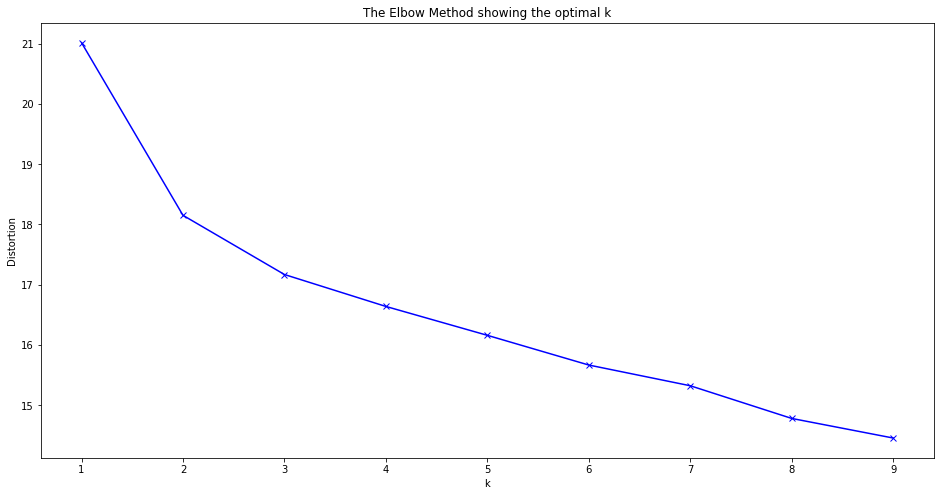

In [48]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

We can observe that the “elbow” is the number **3** which is optimal for this case. Now we can run a K-Means using as n_clusters the number **3**.

In [49]:
# run k-means clustering
kclusters=3
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Metro_Manila_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 
kmeans.labels_.shape

(446,)

In [50]:
# add clustering labels
Metro_Manila_merged = df_final.head(446)
Metro_Manila_merged['Cluster Labels'] = kmeans.labels_

# merge Metro_Manila_grouped with df_Korean to add latitude/longitude for each Locality
Metro_Manila_merged = Metro_Manila_merged.join(Locality_venues_sorted.set_index('Locality'), on='Locality')

Metro_Manila_merged.head()

/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


,Locality,Lat,Lng,No_of_Restaurant,Cusines,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"168 Shopping Mall, Binondo, Manila",14.604273,120.973656,2,"Chinese, Asian",3.400000,"Good, Average",88,2,Chinese Restaurant,Fast Food Restaurant,Bakery,Pizza Place,Bubble Tea Shop,Japanese Restaurant,Grocery Store,Donut Shop,Asian Restaurant,Shopping Mall
1,"238 Center, Banawe, Quezon City",14.643305,121.000312,6,"Chinese, Japanese, Tea, Bubble Tea, Steak, Ame...",3.466667,"Excellent, Good, Average",716,2,Chinese Restaurant,Dessert Shop,Coffee Shop,Steakhouse,Dumpling Restaurant,Gas Station,Filipino Restaurant,Basketball Court,Spa,Bubble Tea Shop
2,"A.Venue Mall, Poblacion, Makati City",14.566090,121.029942,6,"Chinese, Tea, Desserts, Coffee, Middle Eastern...",3.683333,"Good, Very Good, Average",555,0,Korean Restaurant,Café,Hostel,Coffee Shop,Fast Food Restaurant,Spa,Pizza Place,Middle Eastern Restaurant,Bar,Filipino Restaurant
3,"AG New World Manila Bay Hotel, Malate, Manila",14.573424,120.982572,4,"Chinese, Japanese, Filipino, Korean, Chinese, ...",3.700000,"Good, Very Good, Average",171,0,Japanese Restaurant,Bar,Korean Restaurant,Chinese Restaurant,Bakery,Middle Eastern Restaurant,Spa,Shabu-Shabu Restaurant,Restaurant,Clothing Store
4,"ATC Corporate Center, Alabang, Muntinlupa City",14.424588,121.028302,7,"Korean, Grill, Filipino, Mexican, Japanese, Su...",3.957143,"Very Good, Good",972,0,Coffee Shop,Japanese Restaurant,Korean Restaurant,Café,Spa,Department Store,Dessert Shop,Filipino Restaurant,Burger Joint,Donut Shop


### Create Final Map

In [51]:
# create final map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
#colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
#rainbow = [colors.rgb2hex(i) for i in colors_array]
colors = ['red', 'green', 'blue']

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Metro_Manila_merged['Lat'], Metro_Manila_merged['Lng'], Metro_Manila_merged['Locality'], Metro_Manila_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color=colors[cluster],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

If not seen, then look at README.md

## Examine each Clusters

In [52]:
## Cluster 1
C1 = Metro_Manila_merged.loc[Metro_Manila_merged['Cluster Labels'] == 0, Metro_Manila_merged.columns[[1] + list(range(5, Metro_Manila_merged.shape[1]))]]

In [53]:
C1.head(5)

,Lat,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,14.566090,3.683333,"Good, Very Good, Average",555,0,Korean Restaurant,Café,Hostel,Coffee Shop,Fast Food Restaurant,Spa,Pizza Place,Middle Eastern Restaurant,Bar,Filipino Restaurant
3,14.573424,3.700000,"Good, Very Good, Average",171,0,Japanese Restaurant,Bar,Korean Restaurant,Chinese Restaurant,Bakery,Middle Eastern Restaurant,Spa,Shabu-Shabu Restaurant,Restaurant,Clothing Store
4,14.424588,3.957143,"Very Good, Good",972,0,Coffee Shop,Japanese Restaurant,Korean Restaurant,Café,Spa,Department Store,Dessert Shop,Filipino Restaurant,Burger Joint,Donut Shop
5,14.420648,3.233333,"Good, Average",89,0,Café,Hotel Bar,Filipino Restaurant,Yoga Studio,Spa,Steakhouse,Diner,Burger Joint,Dessert Shop,Lounge
6,14.573472,3.375000,"Good, Average",283,0,Coffee Shop,Japanese Restaurant,Breakfast Spot,Wings Joint,Hotel,Ice Cream Shop,Filipino Restaurant,Bakery,Supermarket,Chinese Restaurant


In [54]:
C1.shape

(286, 15)

In [55]:
C1['1st Most Common Venue'].value_counts()

Coffee Shop                99
Café                       28
Filipino Restaurant        25
Japanese Restaurant        20
Shopping Mall              20
Hotel                      13
Chinese Restaurant         10
Bakery                     10
Korean Restaurant           9
Fast Food Restaurant        6
Clothing Store              5
Italian Restaurant          4
Spa                         4
Convenience Store           4
Bar                         3
Seafood Restaurant          3
Pizza Place                 3
Dessert Shop                2
Tea Room                    2
Yoga Studio                 2
Buffet                      2
Donut Shop                  2
Diner                       2
Hotel Bar                   1
Video Store                 1
Airport Terminal            1
Burger Joint                1
Restaurant                  1
Comfort Food Restaurant     1
Pharmacy                    1
Noodle House                1
Name: 1st Most Common Venue, dtype: int64

In [56]:
## Cluster 2
C2 = Metro_Manila_merged.loc[Metro_Manila_merged['Cluster Labels'] == 1, Metro_Manila_merged.columns[[1] + list(range(5, Metro_Manila_merged.shape[1]))]]

In [57]:
C2.head(5)

,Lat,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
17,14.656873,2.600000,Average,7,1,Fast Food Restaurant,Chinese Restaurant,Supermarket,Bookstore,Japanese Restaurant,Mobile Phone Shop,Filipino Restaurant,Donut Shop,Intersection,Arcade
29,14.686639,2.900000,Average,5,1,Fast Food Restaurant,Convenience Store,Bakery,Soup Place,Casino,Creperie,Filipino Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant
36,14.533019,2.950000,Average,11,1,Fast Food Restaurant,Hotel,Fried Chicken Joint,Diner,Filipino Restaurant,Casino,Convenience Store,Food Truck,Flea Market,Donut Shop
56,14.651056,2.466667,"Poor, Average",23,1,Fast Food Restaurant,Convenience Store,Burger Joint,Bakery,Diner,Bubble Tea Shop,Bookstore,Mobile Phone Shop,Café,Chinese Restaurant
74,14.547407,2.900000,Average,4,1,Fast Food Restaurant,Convenience Store,Tapas Restaurant,Diner,Gym,Gym / Fitness Center,Pharmacy,Event Space,Drugstore,Dumpling Restaurant


In [58]:
C2.shape

(42, 15)

In [59]:
C2['1st Most Common Venue'].value_counts()

Fast Food Restaurant    33
Convenience Store        7
Music Venue              1
Chinese Restaurant       1
Name: 1st Most Common Venue, dtype: int64

In [60]:
## Cluster 3
C3 = Metro_Manila_merged.loc[Metro_Manila_merged['Cluster Labels'] == 2, Metro_Manila_merged.columns[[1] + list(range(5, Metro_Manila_merged.shape[1]))]]

In [61]:
C3.head(5)

,Lat,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,14.604273,3.400000,"Good, Average",88,2,Chinese Restaurant,Fast Food Restaurant,Bakery,Pizza Place,Bubble Tea Shop,Japanese Restaurant,Grocery Store,Donut Shop,Asian Restaurant,Shopping Mall
1,14.643305,3.466667,"Excellent, Good, Average",716,2,Chinese Restaurant,Dessert Shop,Coffee Shop,Steakhouse,Dumpling Restaurant,Gas Station,Filipino Restaurant,Basketball Court,Spa,Bubble Tea Shop
7,14.593377,3.650000,"Very Good, Good, Average",1491,2,Convenience Store,Bar,Japanese Restaurant,Vegetarian / Vegan Restaurant,Chinese Restaurant,Fast Food Restaurant,Spa,Bakery,BBQ Joint,Café
14,14.427325,3.500000,"Very Good, Average, Good",436,2,Spa,Restaurant,Convenience Store,Filipino Restaurant,Basketball Court,Food & Drink Shop,Beer Garden,Badminton Court,BBQ Joint,Korean Restaurant
18,14.692027,3.118182,"Good, Average",91,2,Convenience Store,Spa,Chinese Restaurant,Fast Food Restaurant,Coffee Shop,Asian Restaurant,Dumpling Restaurant,Filipino Restaurant,Pharmacy,Pizza Place


In [62]:
C3.shape

(118, 15)

In [63]:
C3['1st Most Common Venue'].value_counts()

Convenience Store       29
Fast Food Restaurant    21
Chinese Restaurant      19
Pizza Place              8
Spa                      7
Coffee Shop              5
Bubble Tea Shop          5
Tea Room                 4
BBQ Joint                4
Filipino Restaurant      3
Restaurant               2
Bakery                   2
Italian Restaurant       1
Korean Restaurant        1
Convention Center        1
Thai Restaurant          1
Bar                      1
Diner                    1
Hotel                    1
Asian Restaurant         1
Steakhouse               1
Name: 1st Most Common Venue, dtype: int64

This is the end!! Just write your conclusion.